# VGGT Attention Visualization Demo

This notebook demonstrates how to use `visualize_attention.py` to extract and visualize attention maps from any frame, any block, and any token in the VGGT model.

## Features:
- Extract attention from **any block** (0-23)
- Visualize attention from **any token** (patch or special token)
- Support for **any attention head**
- Works with **frame attention** and **global attention**
- Both **visualization mode** (plots) and **data mode** (raw numpy arrays)

## Setup

In [49]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

from visualize_attention import (
    AttentionExtractor,
    visualize_attention_map,
    visualize_attention_on_image,
    visualize_frame_attention,
    visualize_all_frames_attention,
    get_attention_values,
    get_all_frames_attention,
    extract_both_attentions,
)
from vggt.models.vggt import VGGT
from vggt.utils.load_fn import load_and_preprocess_images

# Set matplotlib to show figures inline
%matplotlib inline
plt.rcParams['figure.dpi'] = 100

## Load Model and Images

In [50]:
# Setup device
device = "cuda" if torch.cuda.is_available() else "cpu"
dtype = torch.bfloat16 if torch.cuda.is_available() and torch.cuda.get_device_capability()[0] >= 8 else torch.float16

print(f"Device: {device}")
print(f"Dtype: {dtype}")

Device: cuda
Dtype: torch.bfloat16


In [51]:
# Load VGGT model
print("Loading VGGT model...")
model = VGGT.from_pretrained("facebook/VGGT-1B").to(device)
model.eval()
print("Model loaded!")

Loading VGGT model...
Model loaded!


In [52]:
# Load example images
image_paths = [
    "examples/llff_flower/images/000.png",
    "examples/llff_flower/images/005.png",
    "examples/llff_flower/images/010.png"
]

# # Load example images
# image_paths = [
#     "examples/kitchen/images/00.png",
#     "examples/kitchen/images/05.png",
#     "examples/kitchen/images/10.png"
# ]

# Check if files exist
for path in image_paths:
    if not Path(path).exists():
        print(f"Warning: {path} not found!")

print(f"Loading {len(image_paths)} images...")
images = load_and_preprocess_images(image_paths).to(device)
print(f"Images shape: {images.shape}")
print(f"  [Batch, Frames, Channels, Height, Width] = {list(images.shape)}")

Loading 3 images...
Images shape: torch.Size([3, 3, 392, 518])
  [Batch, Frames, Channels, Height, Width] = [3, 3, 392, 518]


## 顯示input圖片

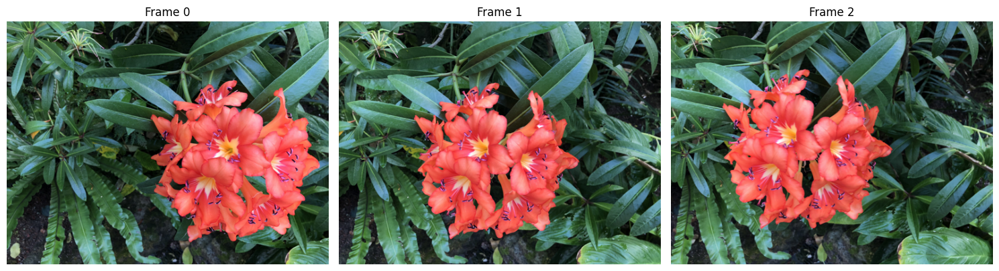

In [53]:
# Display the input images
if len(images.shape) == 4:
    images_display = images.unsqueeze(0)
else:
    images_display = images

S = images_display.shape[1]
fig, axes = plt.subplots(1, S, figsize=(5*S, 5))
if S == 1:
    axes = [axes]

for i in range(S):
    img = images_display[0, i].permute(1, 2, 0).cpu().numpy()
    img = np.clip(img, 0, 1)
    axes[i].imshow(img)
    axes[i].set_title(f'Frame {i}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

## Extract Attention from a Specific Block

Let's extract both frame and global attention from a specific block.

In [54]:
# Choose which block to extract from (0-23)
BLOCK_IDX = 22 #設定哪個block

print(f"Extracting attention from block {BLOCK_IDX}...")
result = extract_both_attentions(model, images, block_idx=BLOCK_IDX, dtype=dtype)

# Get attention weights
frame_attn = result['frame_attention']
global_attn = result['global_attention']
patch_start_idx = result['patch_start_idx']

print("\nExtracted attention shapes:")
if frame_attn:
    print(f"  Frame attention:  {frame_attn['attn_weights'].shape}")
    print(f"    Format: [Batch*Frames, Num_Heads, Num_Tokens, Num_Tokens]")
    print(f"    Num heads: {frame_attn['num_heads']}")
    print(f"    Num tokens: {frame_attn['num_tokens']}")

if global_attn:
    print(f"  Global attention: {global_attn['attn_weights'].shape}")
    print(f"    Format: [Batch, Num_Heads, Total_Tokens, Total_Tokens]")
    print(f"    Num heads: {global_attn['num_heads']}")
    print(f"    Num tokens: {global_attn['num_tokens']}")

print(f"\nPatch start index: {patch_start_idx}")
print(f"  (First {patch_start_idx} tokens are special tokens: camera/register tokens)")

Extracting attention from block 22...

Extracted attention shapes:
  Frame attention:  torch.Size([3, 16, 1041, 1041])
    Format: [Batch*Frames, Num_Heads, Num_Tokens, Num_Tokens]
    Num heads: 16
    Num tokens: 1041
  Global attention: torch.Size([1, 16, 3123, 3123])
    Format: [Batch, Num_Heads, Total_Tokens, Total_Tokens]
    Num heads: 16
    Num tokens: 3123

Patch start index: 5
  (First 5 tokens are special tokens: camera/register tokens)


## Calculate Token Information （算token邊界）

Understanding the token structure is crucial for choosing the right token to visualize.

In [55]:
# Get image dimensions
H, W = images_display.shape[3], images_display.shape[4]
patch_size = 14  # VGGT uses 14x14 patches
grid_h = H // patch_size
grid_w = W // patch_size
num_patches_per_frame = grid_h * grid_w

print("Token Structure Information:")
print(f"  Image size: {H}x{W}")
print(f"  Patch size: {patch_size}x{patch_size}")
print(f"  Grid size: {grid_h}x{grid_w}")
print(f"  Patches per frame: {num_patches_per_frame}")
print(f"  Number of frames: {S}")
print(f"  Total patches (all frames): {S * num_patches_per_frame}")
print(f"\nToken Index Ranges:")
print(f"  Special tokens: 0 to {patch_start_idx-1}")
print(f"  Patch tokens (Frame 0): {patch_start_idx} to {patch_start_idx + num_patches_per_frame - 1}")
if S > 1:
    for i in range(1, S):
        start = patch_start_idx + i * num_patches_per_frame
        end = start + num_patches_per_frame - 1
        print(f"  Patch tokens (Frame {i}): {start} to {end}")

Token Structure Information:
  Image size: 392x518
  Patch size: 14x14
  Grid size: 28x37
  Patches per frame: 1036
  Number of frames: 3
  Total patches (all frames): 3108

Token Index Ranges:
  Special tokens: 0 to 4
  Patch tokens (Frame 0): 5 to 1040
  Patch tokens (Frame 1): 1041 to 2076
  Patch tokens (Frame 2): 2077 to 3112


## Example 1: Visualize Frame Attention from a Specific Token

Visualize how a specific patch token in one frame attends to other patches within the same frame.

Visualizing Frame Attention:
  Block: 22
  Token: 87 (center patch of frame 0)
  Head: 0


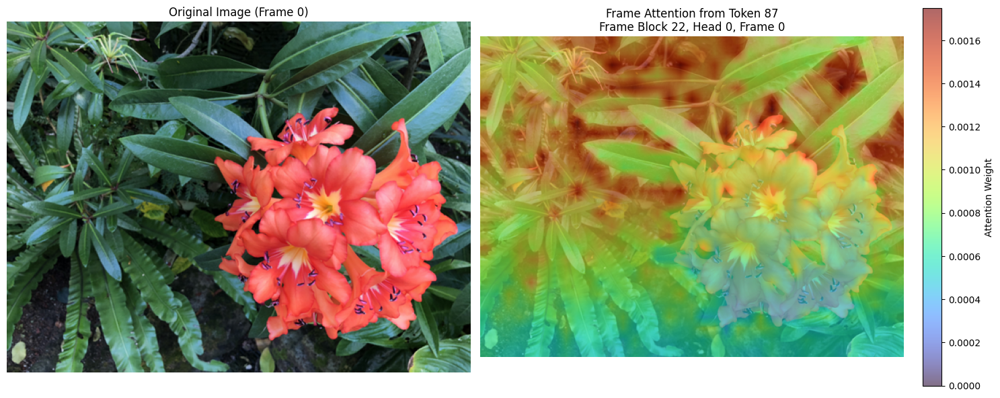

In [56]:
# Choose parameters
TOKEN_IDX = 87  # Center patch of frame 0
HEAD_IDX = 0  # First attention head
FRAME_IDX = 0  # First frame

print(f"Visualizing Frame Attention:")
print(f"  Block: {BLOCK_IDX}")
print(f"  Token: {TOKEN_IDX} (center patch of frame {FRAME_IDX})")
print(f"  Head: {HEAD_IDX}")

# Visualize frame attention
fig = visualize_frame_attention(
    attn_weights=frame_attn['attn_weights'],
    images=images_display,
    token_idx=TOKEN_IDX,
    head_idx=HEAD_IDX,
    patch_start_idx=patch_start_idx,
    frame_idx=FRAME_IDX,
    layer_name=f"Frame Block {BLOCK_IDX}",
    figsize=(15, 6)
)
plt.show()

## Example 2: Visualize Global Attention from a Specific Token

Visualize how a specific token attends to all patches across all frames.

Visualizing Global Attention:
  Block: 22
  Token: 87
  Head: 0


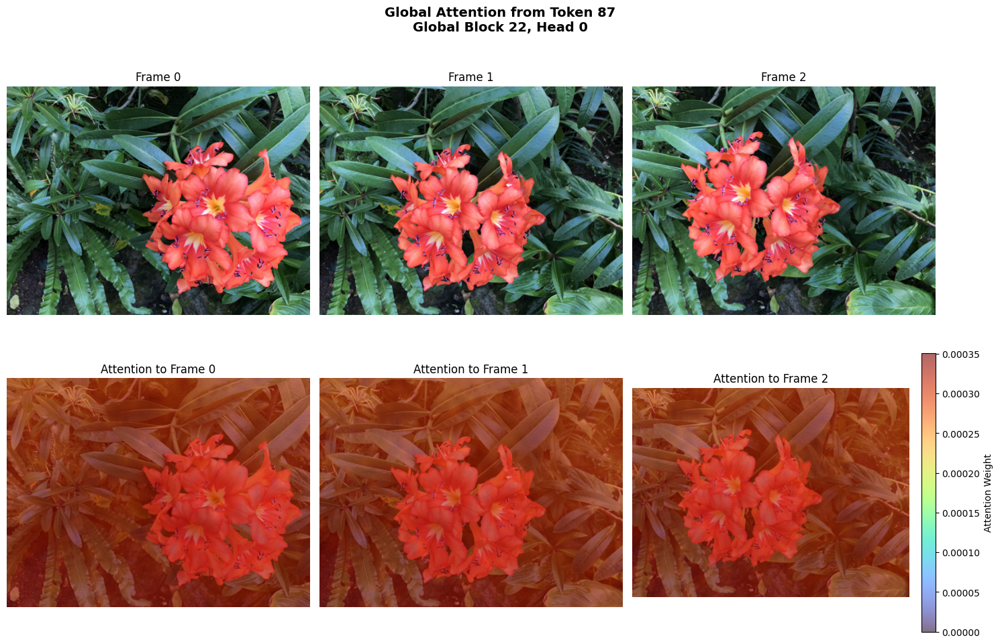

In [57]:
# Choose parameters
TOKEN_IDX = 87  # A patch token
HEAD_IDX = 0

print(f"Visualizing Global Attention:")
print(f"  Block: {BLOCK_IDX}")
print(f"  Token: {TOKEN_IDX}")
print(f"  Head: {HEAD_IDX}")

# Visualize global attention across all frames
fig = visualize_attention_on_image(
    attn_weights=global_attn['attn_weights'],
    images=images_display,
    token_idx=TOKEN_IDX,
    head_idx=HEAD_IDX,
    patch_start_idx=patch_start_idx,
    attention_type='global',
    layer_name=f"Global Block {BLOCK_IDX}",
    figsize=(5*S, 10)
)
plt.show()

## Example 3: Compare Different Attention Heads

Visualize how different attention heads focus on different patterns.

Comparing 4 different attention heads
  Token: 97
  Block: 22


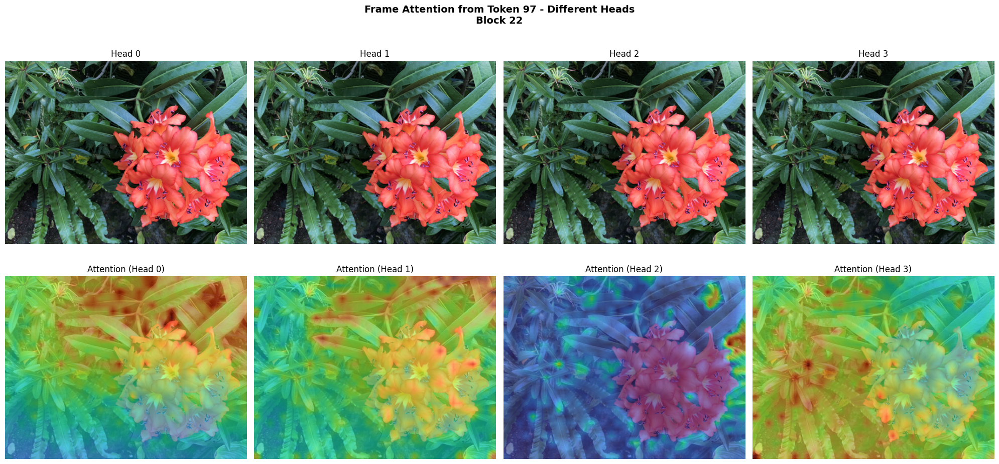

In [58]:
# Compare first 4 heads
TOKEN_IDX = 97
num_heads_to_compare = 4

print(f"Comparing {num_heads_to_compare} different attention heads")
print(f"  Token: {TOKEN_IDX}")
print(f"  Block: {BLOCK_IDX}")

fig, axes = plt.subplots(2, num_heads_to_compare, figsize=(20, 10))

for head_idx in range(num_heads_to_compare):
    # Extract attention for this head
    H_img, W_img = images_display.shape[3], images_display.shape[4]
    attn = frame_attn['attn_weights'][0, head_idx, TOKEN_IDX, :].numpy()
    attn_patches = attn[patch_start_idx:patch_start_idx + num_patches_per_frame]
    attn_map = attn_patches.reshape(grid_h, grid_w)
    
    # Resize to image resolution
    import torch.nn.functional as F
    attn_resized = F.interpolate(
        torch.from_numpy(attn_map).unsqueeze(0).unsqueeze(0),
        size=(H_img, W_img),
        mode='bilinear',
        align_corners=False
    ).squeeze().numpy()
    
    # Original image
    img_np = images_display[0, 0].permute(1, 2, 0).cpu().numpy()
    img_np = np.clip(img_np, 0, 1)
    
    axes[0, head_idx].imshow(img_np)
    axes[0, head_idx].set_title(f'Head {head_idx}')
    axes[0, head_idx].axis('off')
    
    # Attention overlay
    axes[1, head_idx].imshow(img_np)
    im = axes[1, head_idx].imshow(attn_resized, cmap='turbo', alpha=0.6, vmin=0, vmax=attn_resized.max())
    axes[1, head_idx].set_title(f'Attention (Head {head_idx})')
    axes[1, head_idx].axis('off')

plt.suptitle(f'Frame Attention from Token {TOKEN_IDX} - Different Heads\nBlock {BLOCK_IDX}', 
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## Example 4: Visualize All Frames (Frame Attention)

When you have multiple frames, visualize the frame attention for each frame separately.

Visualizing frame attention across all 3 frames
  Token: 523 (relative to each frame)
  Head: 0


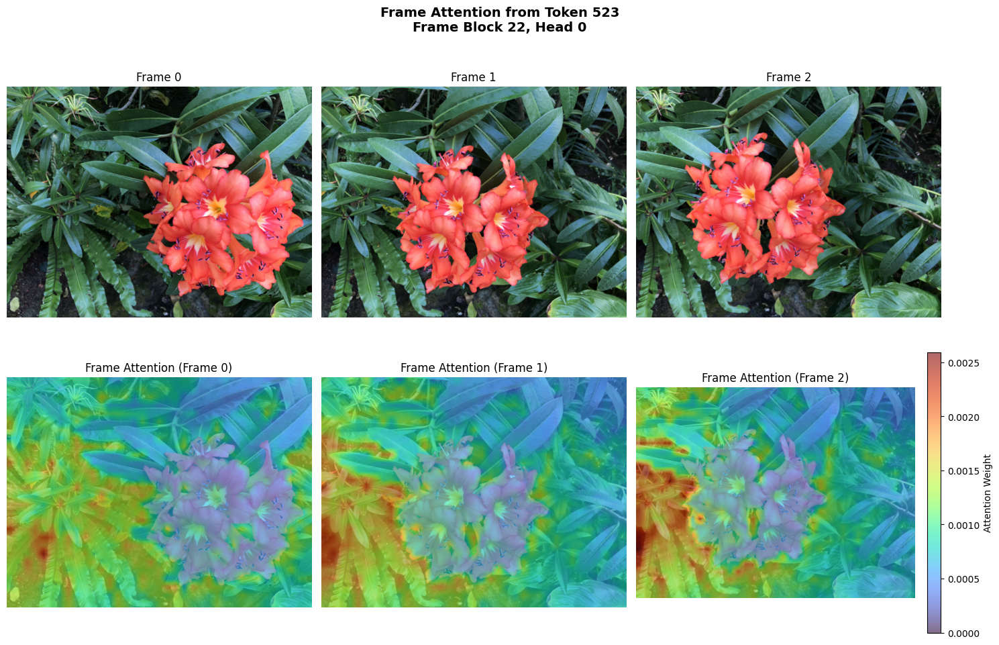

In [59]:
# Visualize frame attention for all frames
TOKEN_IDX = 523
HEAD_IDX = 0

print(f"Visualizing frame attention across all {S} frames")
print(f"  Token: {TOKEN_IDX} (relative to each frame)")
print(f"  Head: {HEAD_IDX}")

fig = visualize_all_frames_attention(
    attn_weights=frame_attn['attn_weights'],
    images=images_display,
    token_idx=TOKEN_IDX,
    head_idx=HEAD_IDX,
    patch_start_idx=patch_start_idx,
    frame_indices=None,  # None means all frames
    layer_name=f"Frame Block {BLOCK_IDX}"
)
plt.show()

## Example 5: Extract Raw Attention Values (Data Mode)

Get the raw attention values as numpy arrays for further analysis.

In [60]:
# Extract frame attention values
TOKEN_IDX = 200
HEAD_IDX = 0

print(f"Extracting raw frame attention values:")
print(f"  Token: {TOKEN_IDX}")
print(f"  Head: {HEAD_IDX}")

frame_values = get_attention_values(
    attn_weights=frame_attn['attn_weights'],
    images=images_display,
    token_idx=TOKEN_IDX,
    head_idx=HEAD_IDX,
    patch_start_idx=patch_start_idx,
    attention_type='frame' #可以extract frame attention value 或 global attention value
)

print("\nExtracted data:")
print(f"  attention_maps shape: {frame_values['attention_maps'].shape}")
print(f"  attention_maps_resized shape: {frame_values['attention_maps_resized'].shape}")
print(f"  images shape: {frame_values['images'].shape}")
print(f"\nMetadata:")
for key, value in frame_values['metadata'].items():
    print(f"  {key}: {value}")


Extracting raw frame attention values:
  Token: 200
  Head: 0

Extracted data:
  attention_maps shape: (28, 37)
  attention_maps_resized shape: (392, 518)
  images shape: (3, 392, 518, 3)

Metadata:
  grid_h: 28
  grid_w: 37
  H: 392
  W: 518
  S: 3
  token_idx: 200
  head_idx: 0
  attention_type: frame
  patch_start_idx: 5


In [61]:
# Extract global attention values
TOKEN_IDX = patch_start_idx + 100
HEAD_IDX = 0

print(f"Extracting raw global attention values:")
print(f"  Token: {TOKEN_IDX}")
print(f"  Head: {HEAD_IDX}")

global_values = get_attention_values(
    attn_weights=global_attn['attn_weights'],
    images=images_display,
    token_idx=TOKEN_IDX,
    head_idx=HEAD_IDX,
    patch_start_idx=patch_start_idx,
    attention_type='global' #可以extract frame attention value 或 global attention value
)

print("\nExtracted data:")
print(f"  attention_maps shape: {global_values['attention_maps'].shape}")
print(f"  attention_maps_resized shape: {global_values['attention_maps_resized'].shape}")
print(f"  images shape: {global_values['images'].shape}")
print(f"\nMetadata:")
for key, value in global_values['metadata'].items():
    print(f"  {key}: {value}")

Extracting raw global attention values:
  Token: 105
  Head: 0

Extracted data:
  attention_maps shape: (3, 28, 37)
  attention_maps_resized shape: (3, 392, 518)
  images shape: (3, 392, 518, 3)

Metadata:
  grid_h: 28
  grid_w: 37
  H: 392
  W: 518
  S: 3
  token_idx: 105
  head_idx: 0
  attention_type: global
  patch_start_idx: 5


## (Optinal) Example 6: Save Attention Maps to Disk

Save the extracted attention values for later analysis.

In [62]:
# Save attention maps
output_dir = Path("attention_outputs")
output_dir.mkdir(exist_ok=True)

# Save frame attention
np.save(
    output_dir / f"block{BLOCK_IDX}_token{TOKEN_IDX}_head{HEAD_IDX}_frame_attention.npy",
    frame_values['attention_maps']
)

# Save global attention
np.save(
    output_dir / f"block{BLOCK_IDX}_token{TOKEN_IDX}_head{HEAD_IDX}_global_attention.npy",
    global_values['attention_maps']
)

print(f"Attention maps saved to {output_dir}/")
print(f"  - block{BLOCK_IDX}_token{TOKEN_IDX}_head{HEAD_IDX}_frame_attention.npy")
print(f"  - block{BLOCK_IDX}_token{TOKEN_IDX}_head{HEAD_IDX}_global_attention.npy")

Attention maps saved to attention_outputs/
  - block22_token105_head0_frame_attention.npy
  - block22_token105_head0_global_attention.npy


## (Optinal) Example 7: Extract Attention from Multiple Blocks

Compare attention patterns across different layers.

Comparing attention across blocks: [2, 12, 22]
  Processing block 2...
  Processing block 12...
  Processing block 22...


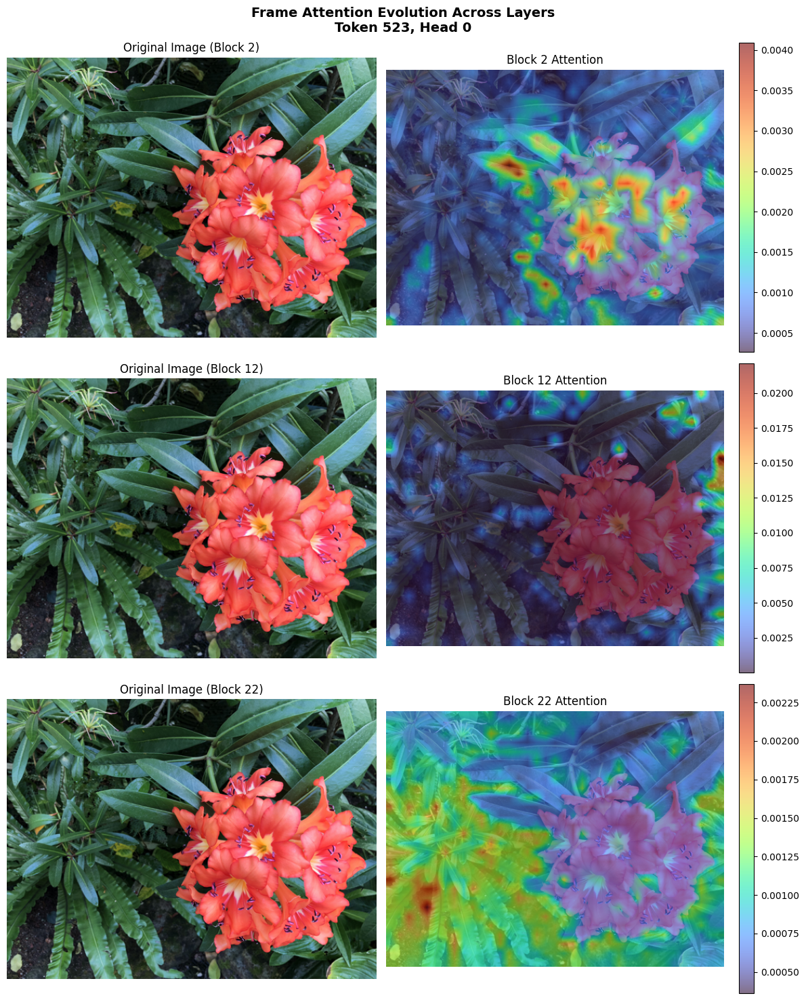

Done!


In [63]:
# Compare attention from early, middle, and late blocks
blocks_to_compare = [2, 12, 22]  # Early, middle, late
TOKEN_IDX = patch_start_idx + num_patches_per_frame // 2
HEAD_IDX = 0

print(f"Comparing attention across blocks: {blocks_to_compare}")

fig, axes = plt.subplots(len(blocks_to_compare), 2, figsize=(12, 5*len(blocks_to_compare)))

for i, block_idx in enumerate(blocks_to_compare):
    print(f"  Processing block {block_idx}...")
    
    # Extract attention for this block
    block_result = extract_both_attentions(model, images, block_idx=block_idx, dtype=dtype)
    block_frame_attn = block_result['frame_attention']
    
    # Extract attention map
    attn = block_frame_attn['attn_weights'][0, HEAD_IDX, TOKEN_IDX, :].numpy()
    attn_patches = attn[patch_start_idx:patch_start_idx + num_patches_per_frame]
    attn_map = attn_patches.reshape(grid_h, grid_w)
    
    # Resize
    import torch.nn.functional as F
    attn_resized = F.interpolate(
        torch.from_numpy(attn_map).unsqueeze(0).unsqueeze(0),
        size=(H, W),
        mode='bilinear',
        align_corners=False
    ).squeeze().numpy()
    
    # Plot
    img_np = images_display[0, 0].permute(1, 2, 0).cpu().numpy()
    img_np = np.clip(img_np, 0, 1)
    
    axes[i, 0].imshow(img_np)
    axes[i, 0].set_title(f'Original Image (Block {block_idx})')
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(img_np)
    im = axes[i, 1].imshow(attn_resized, cmap='turbo', alpha=0.6)
    axes[i, 1].set_title(f'Block {block_idx} Attention')
    axes[i, 1].axis('off')
    plt.colorbar(im, ax=axes[i, 1], fraction=0.046, pad=0.04)

plt.suptitle(f'Frame Attention Evolution Across Layers\nToken {TOKEN_IDX}, Head {HEAD_IDX}',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("Done!")

## (Optinal) Example 8: Custom Attention Extraction with AttentionExtractor

Use the `AttentionExtractor` class directly for more control.

In [64]:
# Create extractor
extractor = AttentionExtractor(model)

# Register hooks for multiple blocks
blocks_to_extract = [10, 15, 20, 23]
print(f"Registering hooks for blocks: {blocks_to_extract}")
extractor.register_hooks(
    block_indices=blocks_to_extract,
    attention_types=['frame', 'global']
)

# Forward pass
print("Running forward pass...")
with torch.no_grad():
    with torch.cuda.amp.autocast(dtype=dtype):
        _ = model(images)

# Get all attention maps
attention_maps = extractor.get_attention_maps()

print("\nExtracted attention maps:")
for layer_name, attn_data in attention_maps.items():
    print(f"  {layer_name}:")
    print(f"    Shape: {attn_data['attn_weights'].shape}")
    print(f"    Type: {attn_data['layer_type']}")
    print(f"    Num heads: {attn_data['num_heads']}")
    print(f"    Num tokens: {attn_data['num_tokens']}")

# Clean up
extractor.clear_hooks()
print("\nHooks cleared.")

Registering hooks for blocks: [10, 15, 20, 23]
Running forward pass...

Extracted attention maps:
  frame_block_10:
    Shape: torch.Size([3, 16, 1041, 1041])
    Type: frame
    Num heads: 16
    Num tokens: 1041
  global_block_10:
    Shape: torch.Size([1, 16, 3123, 3123])
    Type: global
    Num heads: 16
    Num tokens: 3123
  frame_block_15:
    Shape: torch.Size([3, 16, 1041, 1041])
    Type: frame
    Num heads: 16
    Num tokens: 1041
  global_block_15:
    Shape: torch.Size([1, 16, 3123, 3123])
    Type: global
    Num heads: 16
    Num tokens: 3123
  frame_block_20:
    Shape: torch.Size([3, 16, 1041, 1041])
    Type: frame
    Num heads: 16
    Num tokens: 1041
  global_block_20:
    Shape: torch.Size([1, 16, 3123, 3123])
    Type: global
    Num heads: 16
    Num tokens: 3123
  frame_block_23:
    Shape: torch.Size([3, 16, 1041, 1041])
    Type: frame
    Num heads: 16
    Num tokens: 1041
  global_block_23:
    Shape: torch.Size([1, 16, 3123, 3123])
    Type: global
    N

## Summary

This notebook demonstrated:

1. ✅ Loading VGGT model and images
2. ✅ Extracting attention from **any block** (0-23)
3. ✅ Visualizing attention from **any token** (patch or special token)
4. ✅ Comparing different **attention heads**
5. ✅ Visualizing **frame attention** and **global attention**
6. ✅ Extracting **raw attention values** for analysis
7. ✅ Saving attention maps to disk
8. ✅ Comparing attention across different layers
9. ✅ Using `AttentionExtractor` for custom workflows

### Key Parameters:
- `block_idx`: Which transformer block (0-23)
- `token_idx`: Which token to query (≥ patch_start_idx for patches)
- `head_idx`: Which attention head (0 to num_heads-1)
- `frame_idx`: Which frame to visualize (for frame attention)
- `attention_type`: 'frame' or 'global'

### Available Functions:
- `extract_both_attentions()`: Extract frame + global attention
- `visualize_frame_attention()`: Visualize single frame
- `visualize_all_frames_attention()`: Visualize all frames
- `visualize_attention_on_image()`: Visualize on actual images
- `get_attention_values()`: Get raw numpy arrays
- `get_all_frames_attention()`: Get attention for multiple frames